In [49]:
import geopandas as gpd
import pandas as pd
import seaborn as sns
from bokeh.io import output_notebook, show
from bokeh.models import GeoJSONDataSource, LinearColorMapper, HoverTool
from bokeh.models import Panel, Tabs
from bokeh.plotting import figure
from bokeh.palettes import Viridis256
from bokeh.layouts import column
from shapely.geometry import Point
from shapely import wkt
import json
import matplotlib.pyplot as plt

output_notebook()

Loading BokehJS ...

In [2]:
complexity = pd.read_csv('complexity_SLE.4.2.1_1.csv')
complexity.geometry = complexity['geometry'].apply(wkt.loads)
complexity = gpd.GeoDataFrame(complexity, geometry='geometry', crs="EPSG:4326")
block_summary = gpd.read_file('SLE.4.2.1_1_summary.geojson')

In [3]:
complexity.head()

,block_id,geometry,complexity,centroids_multipoint
0,SLE.4.2.1_1_0,"POLYGON ((-13.26653 8.39571, -13.26659 8.39571...",6,MULTIPOINT (-13.26298549022347 8.4054583794610...
1,SLE.4.2.1_1_7,"POLYGON ((-13.28884 8.42653, -13.28875 8.42653...",6,MULTIPOINT (-13.29232656345092 8.4366623936158...
2,SLE.4.2.1_1_13,"POLYGON ((-13.28613 8.43598, -13.28597 8.43599...",10,"MULTIPOINT (-13.28328855 8.4363443, -13.282572..."
3,SLE.4.2.1_1_17,"POLYGON ((-13.28046 8.43931, -13.28042 8.43931...",5,"MULTIPOINT (-13.27979785 8.43913745, -13.27952..."
4,SLE.4.2.1_1_24,"POLYGON ((-13.27932 8.44653, -13.27958 8.44653...",5,"MULTIPOINT (-13.27956925 8.44955455, -13.27961..."


In [4]:
block_summary.head()

,block_id,block_area,block_bldg_count,block_bldg_area,block_bldg_area_density,block_bldg_count_density,block_pop,block_pop_density,geometry
0,SLE.4.1.1_1_31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((-13.21078 8.43236, -13.21043 8.43279..."
1,SLE.4.1.1_1_32,0.10373,41.0,0.004133,0.039844,395.255639,53.293850,513.773045,"POLYGON ((-13.21042 8.43280, -13.20787 8.43603..."
2,SLE.4.1.1_1_33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((-13.20739 8.43695, -13.20681 8.43805..."
3,SLE.4.1.1_1_34,0.01532,1.0,0.000017,0.001136,65.275567,0.072653,4.742494,"POLYGON ((-13.20680 8.43808, -13.20607 8.43946..."
4,SLE.4.1.1_1_35,0.73683,85.0,0.022864,0.031030,115.359010,162.852237,221.017327,"POLYGON ((-13.20606 8.43947, -13.20397 8.44343..."


In [5]:
block_summary = block_summary.drop('geometry', 1)
df = gpd.GeoDataFrame(complexity.merge(block_summary, on='block_id', how='left'))

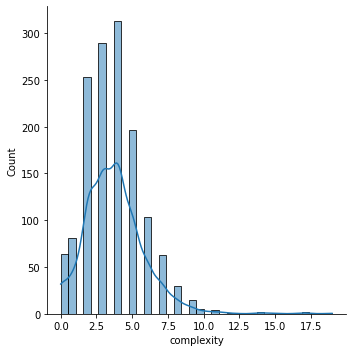

In [6]:
sns.displot(data=df, x='complexity', kind='hist', kde=True);

In [7]:
print(f'There are {len(df[df["complexity"] > 15])} blocks with k complexity greater than 15')
df[df['complexity'] > 15].head()

There are 3 blocks with k complexity greater than 15


,block_id,geometry,complexity,centroids_multipoint,block_area,block_bldg_count,block_bldg_area,block_bldg_area_density,block_bldg_count_density,block_pop,block_pop_density
42,SLE.4.2.1_1_164,"POLYGON ((-13.19432 8.46014, -13.19434 8.46012...",17,MULTIPOINT (-13.20342034468923 8.4769632326204...,4.642988,3227.0,0.286213,0.061644,695.026618,21280.009979,4583.257941
493,SLE.4.2.1_1_759,"POLYGON ((-13.22854 8.45392, -13.22854 8.45392...",19,MULTIPOINT (-13.22740996690265 8.4526928986667...,2.515602,4663.0,0.433018,0.172133,1853.631788,31191.172967,12399.088509
499,SLE.4.2.1_1_766,"POLYGON ((-13.21860 8.46226, -13.21860 8.46228...",17,MULTIPOINT (-13.21466426979609 8.4764868349779...,1.932512,3508.0,0.330004,0.170764,1815.253721,23908.338315,12371.636286


In [8]:
df.index = df['block_id']
points = [list(polygon.exterior.coords) for polygon in df['geometry']]
lats = [[] for point_set in points]
block_xs = []
block_ys = []
for block_id in df.index.tolist():
    points = list(df.loc[block_id].geometry.exterior.coords)
    block_xs.append([point[0] for point in points])
    block_ys.append([point[1] for point in points])

df['Lat'] = block_xs
df['Lon'] = block_ys

In [24]:
source = GeoJSONDataSource(geojson=json.dumps(json.loads(df.to_json())))
TOOLS = "pan,wheel_zoom,reset,hover,save,box_zoom"
TOOLTIPS = [
    ("Block ID", "@block_id"),
    ("K-Complexity", "@complexity"),
    ("Block Population", "@block_pop"),
    ("Block Area", "@block_area"),
    ("Building Area", "@block_bldg_area"),
    ("Block Building Count", "@block_bldg_count"),
    ("Block Population Density", "@block_pop_density")
]

def gen_plot(source, tools, tooltips, title, field):
    color_mapper = LinearColorMapper(Viridis256)
    p = figure(title=title, tools=tools, x_axis_location=None, y_axis_location=None)
    p.add_tools(HoverTool(tooltips=tooltips))
    p.patches('Lat', 'Lon', source=source,
              fill_color={'field': field, 'transform': color_mapper},
              fill_alpha=0.7, line_color="black", line_width=0.1)
    p.xgrid.visible = False
    p.ygrid.visible = False
    return p

tab1 = Panel(child=gen_plot(source, TOOLS, TOOLTIPS, 'K-Complexity of Freetown', 'complexity'), title='K-Complexity of Freetown')
tab2 = Panel(child=gen_plot(source, TOOLS, TOOLTIPS, 'Population Estimates of Freetown', 'block_pop'), title='Population Estimates of Freetown')

tabs = Tabs(tabs=[tab1, tab2])
show(tabs)

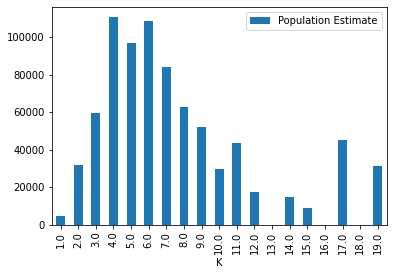

In [10]:
k_pop_estimates = []
k_pop_estimates = [sum(df[df['complexity'] == k+1]['block_pop']) for k in range(min(df['complexity']), max(df['complexity']), 1)]
k_pop_estimates = pd.DataFrame(data=[[k+1 for k in range(len(k_pop_estimates))], k_pop_estimates]).T
k_pop_estimates.columns = ['K', 'Population Estimate']
k_pop_estimates.head()
k_pop_estimates.plot.bar(x='K', y='Population Estimate');

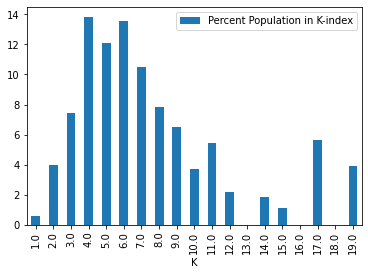

In [11]:
total_pop = k_pop_estimates['Population Estimate'].sum()
k_pop_estimates['Percent Population in K-index'] = [(pop_est/total_pop)*100 for pop_est in k_pop_estimates['Population Estimate']]
k_pop_estimates.plot.bar(x='K', y='Percent Population in K-index');

In [12]:
def summarize_by_k(df, stat, verbose=False):
    for k in range(min(df['complexity']), max(df['complexity']), 1):
        k_df = df[df['complexity']==k]
        if verbose:
            print(f'Min {stat} at k = {k} is: {k_df[stat].min()}')
            print(f'Median {stat} at k = {k} is: {k_df[stat].median()}')
            print(f'Mean {stat} at k = {k} is: {k_df[stat].mean()}')
            print(f'Max {stat} at k = {k} is {k_df[stat].max()}')
            print('\n')
    sns.barplot(x="complexity", y=stat, data=df)

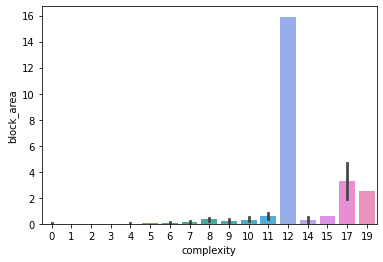

In [13]:
summarize_by_k(df, 'block_area')

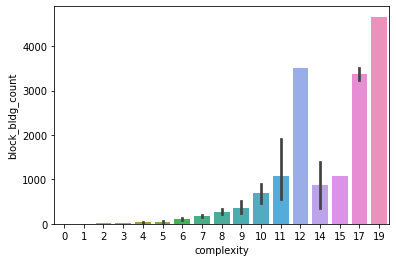

In [14]:
summarize_by_k(df, 'block_bldg_count')

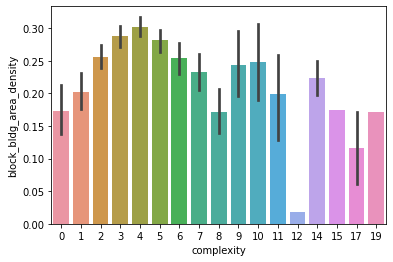

In [15]:
summarize_by_k(df, 'block_bldg_area_density')

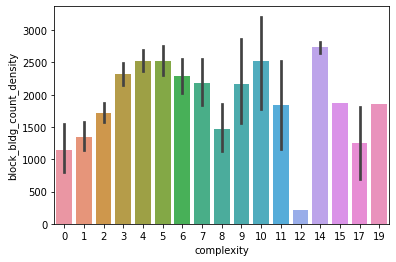

In [16]:
summarize_by_k(df, 'block_bldg_count_density')

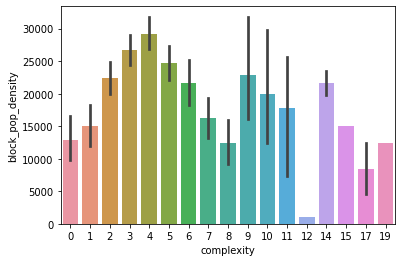

In [17]:
summarize_by_k(df, 'block_pop_density')

81.46077623861073

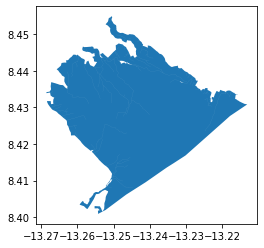

In [18]:
df = df.sort_values(by='block_area', ascending=False)
max_poly = df[df['block_area'] == df.iloc[0]['block_area']]
max_poly.plot()
max_poly['block_area']
sum(df['block_area'])

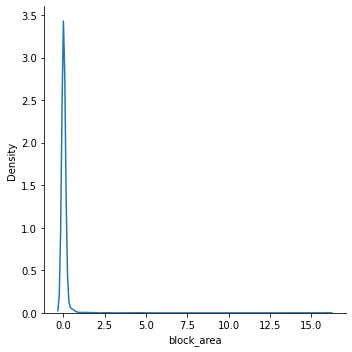

In [20]:
sns.displot(data=df, x='block_area', kind='kde');

In [41]:
w_area = gpd.read_file('../../data/gadm36_SLE_shp/gadm36_SLE_1.shp')
w_area = w_area[w_area['NAME_1'] == 'Western']
w_area = w_area.to_crs("EPSG:3395")
w_area['area'] = w_area.area * 1e-6
w_area = w_area.to_crs("EPSG:4326")
w_area

,GID_0,NAME_0,GID_1,NAME_1,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,CC_1,HASC_1,geometry,area
3,SLE,Sierra Leone,SLE.4_1,Western,None,None,Province,Province,None,SL.WE,"MULTIPOLYGON (((-13.24347 8.10069, -13.24347 8...",732.742189


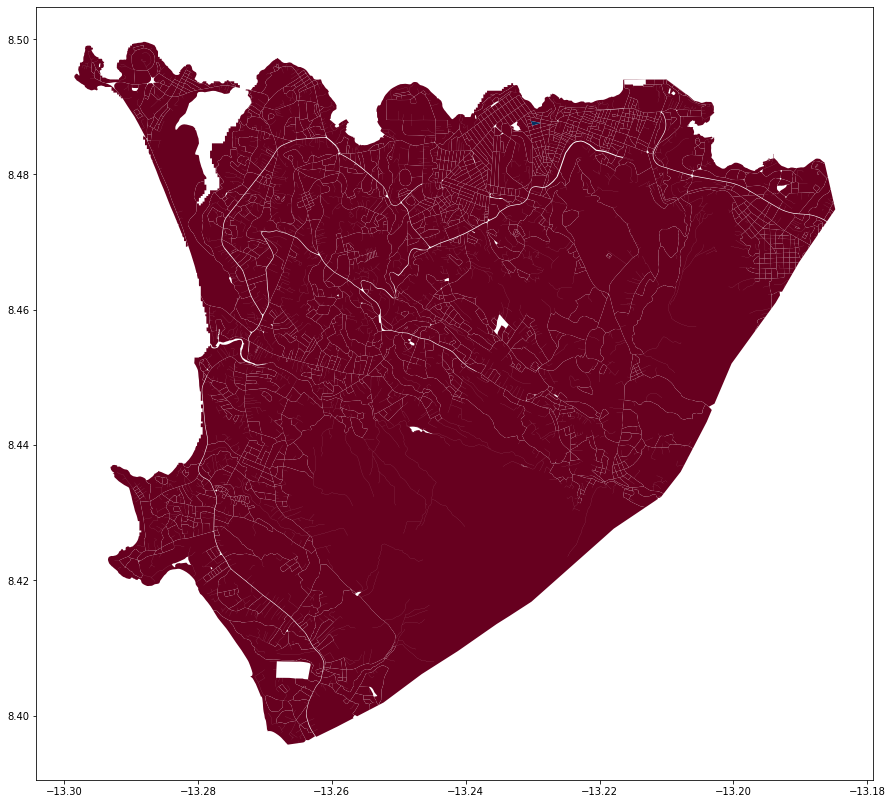

In [61]:
df['bad_area'] = [1 if block_area < block_bldg_area else 0 for block_area, block_bldg_area in zip(df['block_area'], df['block_bldg_area'])]
df.plot(column='bad_area', figsize=(15, 15), cmap='RdBu')
plt.show()

In [62]:
df['bad_area'].sum()

1